# DSS x TNC Spring 2022 Project

### Trend of water rights approvals over time

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
pip install rtree

In [ ]:
pip install pygeos

In [ ]:
pip install folium==0.12.1

In [ ]:
!pip install mapclassify==2.4.3

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
pip install geopandas

In [ ]:
import plotly.express as px
import time
from datetime import datetime
import calendar
import geopandas as gpd
import folium
from shapely.geometry import Point
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)

/shared-libs/python3.7/py/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


The process_all_trends function takes in any file_name and water_right type and provides the total amount of applications per decade, summarizes the decade for acre feet.

In [ ]:
def process_all_trends(file_name, water_right_type):
    df = pd.read_csv(file_name)

    #filter by application (water right) type
    df = df.loc[df.WATER_RIGHT_TYPE == water_right_type].copy()
    
    #create datetime data structure
    df['STATUS_EFFECTIVE_DATE'] = pd.to_datetime(df['STATUS_EFFECTIVE_DATE'], errors = 'coerce')
    df['status_effective_year'] = pd.DatetimeIndex(df['STATUS_EFFECTIVE_DATE']).year

    #count the total amount of applications per decade
    df_all = df.copy()
    df_all = df_all.loc[df_all.POD_TYPE.isin(['Point of Direct Diversion'])] #Focus on diversions (not storage behind dams)
    df_all = df_all.loc[df_all.USE_CODE != 'Power'] # Remove power generating rights
    df_all = df_all.sort_values(by=['status_effective_year'], ascending=[True])
    df_all['decade'] = (df.status_effective_year//10)*10
    df_all.drop_duplicates(subset=['APPLICATION_NUMBER'])
    df_all = (df_all.groupby('decade')
           .agg({'FACE_VALUE_AMOUNT':'count'})
           .reset_index()
           .rename(columns={'FACE_VALUE_AMOUNT':'total_applications'})
          )
    
    df1 = df.loc[df.STATUS_AT_STATUS_EFFECTIVEDATE.isin(['Licensed', 'Permitted'])] # Focus on approved water rights
    df1 = df1.loc[df1.POD_TYPE.isin(['Point of Direct Diversion'])] #Focus on diversions (not storage behind dams)
    df1 = df1.loc[df1.USE_CODE != 'Power'] # Remove power generating rights
    df1 = df1.sort_values(by=['status_effective_year'], ascending=[True])
    df1 = df1.drop_duplicates(subset=['APPLICATION_NUMBER']) #keeps on the first year that the application was licensed or permitted
    df2 = (df1.groupby('status_effective_year')
               .agg({'FACE_VALUE_AMOUNT':'sum'}) #sum FACE_VAL_AMT column
               .reset_index()
               .rename(columns={'FACE_VALUE_AMOUNT':'face_value_acre_feet'})
              )
    #print(df2)
    
    # Summarize by decade for acre feet
    df1['decade'] = (df1.status_effective_year//10)*10
    df3 = (df1.groupby('decade')
               .agg({'FACE_VALUE_AMOUNT':'sum'})
               .reset_index()
               .rename(columns={'FACE_VALUE_AMOUNT':'face_value_acre_feet'})
              )
    print(df3)

    print(df3.describe())
    
    fig = px.bar(df3, x='decade', y='face_value_acre_feet')
    fig.show()
    #for approved count
    df4 = (df1.groupby('decade')
           .agg({'FACE_VALUE_AMOUNT':'count'})
           .reset_index()
           .rename(columns={'FACE_VALUE_AMOUNT':'count_approved'})
          )
    print(df4)
    
    print(df4.describe())

    fig = px.bar(df4, x='decade', y='count_approved')
    fig.show()
    
    
    #face value vs. actual count of applications 
    df5 = pd.merge(df4, df_all, on='decade')
    #print(df5)
    
    #percent of water diverted over total volume of water in water source
    df6 = (df1.groupby('decade')
           .agg({'DIRECT_DIV_AMOUNT':'sum'})
           .reset_index()
           .rename(columns={'DIRECT_DIV_AMOUNT':'water_diverted'})
          ) #still in progress
    #print(df6)

### Deliverable #1: What are the trends in the number and magnitude of water rights that have been approved over time? Is it increasing or decreasing?

Evident from the histograms, the number of appropriative water rights approved follows a rough bell curve distribution over time. For reference, there were only 38 appropriative water rights approved in 2010. As the mean number of appropriative water rights approved is 551, there are significantly less water rights being approved today than there were in the past. This is likely due to the fact that the water right application process was probably more lenient in the past. Furthermore, the average acre feet per water right approval is decreasing. While the mean acre ft per water right approval is 7,689, the acre ft per water right approval in 2010 was 2,973, indicating that each new approval is taking up less space than past approvals. This trend is likely due to the fact that there is generally less water available to be claimed by a water right. Additionally, the water that is still available is likely more protected than it was in the past.

In [ ]:
process_all_trends('water-rights-status-history.csv', 'Appropriative')

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (11,13,16,18,24,26,39,40,42,45,47,49,50,51,53,58,68,73,79,80,99,105,112,123,133,140,141,142,143,144,145,147,148,149,150,151,152,153,154,155,156,157,158,160,161,162,163) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
    decade  face_value_acre_feet
0   1910.0          1.268934e+06
1   1920.0          2.746669e+06
2   1930.0          5.039151e+06
3   1940.0          5.888537e+06
4   1950.0          1.363600e+07
5   1960.0          3.486027e+06
6   1970.0          1.402877e+07
7   1980.0          1.177822e+06
8   1990.0          5.349510e+05
9   2000.0          2.997185e+06
10  2010.0          1.138638e+05
11  2020.0          5.300000e+01
            decade  face_value_acre_feet
count    12.000000          1.200000e+01
mean   1965.000000          4.243163e+06
std      36.055513          4.8

    decade  count_approved
0   1910.0             116
1   1920.0             628
2   1930.0             675
3   1940.0            1058
4   1950.0            1550
5   1960.0            1232
6   1970.0             501
7   1980.0             490
8   1990.0             166
9   2000.0             161
10  2010.0              38
11  2020.0               2
            decade  count_approved
count    12.000000       12.000000
mean   1965.000000      551.416667
std      36.055513      504.565963
min    1910.000000        2.000000
25%    1937.500000      149.750000
50%    1965.000000      495.500000
75%    1992.500000      770.750000
max    2020.000000     1550.000000


### Deliverable #2: What is the spatial distribution of trends? Are more water rights approved in certain regions or not?

The create_spacial_join_map function visualizes the spatial distribution of trends by creating a map of California with two layers. The first layer represents the number of water rights applications in each watershed, and the second layer represents each water rights application and its status. 

In the first layer, each watershed is analyzed based on the number of applications that were filed, along with a classification of whether or not the watershed location should be classified as senstive. Sensitive is defined as whether or not the total volume of water covered by the water rights applications consumes a significant portion of the total average flows volume for that watershed. If the water rights cover over 10% of the total average volumes, this indicates the watershed is sensitive. If a watershed is sensitive, this future water rights applications in that area should be evaluated on a rigorous basis and heavily factor in the environmental impact of the water right before being approved. Looking at the map, the spacial distribution of sensitive areas can be observed and if sensitive areas are grouped next to each other.

In the second layer, each water right application is shown with information about its application number, status, water right type, and face value amount. Looking at the distribution of these points can indicate if more water rights are approved in certain regions, and cross reference that with whether those regions are considered sensitive or not.

In [ ]:
# load in 3 dataset used to merge 
shapefile = gpd.read_file("Catchment.shp")

natural_csv =  gpd.read_file('Natural_Flows_California_Annual_mean_monthly_1950_2015_mean.csv').rename(columns={'FEATUREID,N,9,0': 'FEATUREID'})
natural_csv['FEATUREID'] = natural_csv['FEATUREID'].astype(int)

water_rights = pd.read_csv('water-rights-status-history.csv')
water_rights = water_rights.dropna(subset=['LATITUDE', 'LONGITUDE'])
water_rights = gpd.GeoDataFrame(water_rights, geometry=gpd.points_from_xy(water_rights.LONGITUDE, water_rights.LATITUDE))


/shared-libs/python3.7/py-core/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3229: DtypeWarning:

Columns (11,13,16,18,24,26,39,40,42,45,47,49,50,51,53,58,68,73,79,80,99,105,112,123,133,140,141,142,143,144,145,147,148,149,150,151,152,153,154,155,156,157,158,160,161,162,163) have mixed types.Specify dtype option on import or set low_memory=False.



In [ ]:
# merge shapefile with natural flows
merged = shapefile.merge(natural_csv, on="FEATUREID").drop_duplicates().rename(columns={'geometry_x': 'geometry'})
merged = gpd.GeoDataFrame(merged, geometry=merged.geometry)

#merge merged table (shapefile and natural flows) with water right status table on gridcode column
all_merged = water_rights.sjoin(merged, how="inner", op="within")
merged_w_gridcode = merged[['GRIDCODE', 'geometry']]
all_merged_on_gridcode = all_merged.merge(merged_w_gridcode, on='GRIDCODE').rename(columns={'geometry_y': 'geometry_poly'}).astype({'avg_annual_flow_cfs': float})


/shared-libs/python3.7/py-core/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3524: FutureWarning:

The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.



In [ ]:
# group merged table based on gridcode
# create new columns with data aggregated per gridcode:
# WR_WATER_RIGHT_ID: number of water rights applications
# avg_annual_flow_cfs: sum of average annual flows based on natural flows data
# FACE_VALUE_AMOUNT: sum of face value amount requested for use from all applications 
# percent used: % of average annual flow for a gridcode that's actually used by a water right
# sensitive: whether or not a gridcode is considered a sensitive area, if their percentage of use is above 10%

grouped_on_gridcode = all_merged_on_gridcode.groupby('GRIDCODE').agg({'WR_WATER_RIGHT_ID': 'count', 'avg_annual_flow_cfs': 'sum', 'FACE_VALUE_AMOUNT': 'sum'})
grouped_on_gridcode = grouped_on_gridcode.merge(merged_w_gridcode.set_index('GRIDCODE'), left_index=True, right_index=True)
grouped_on_gridcode['percent used'] = grouped_on_gridcode['FACE_VALUE_AMOUNT'] / grouped_on_gridcode['avg_annual_flow_cfs']
grouped_on_gridcode['sensitive'] = grouped_on_gridcode['percent used'] > 0.1

In [ ]:
all_types = water_rights['WATER_RIGHT_TYPE'].unique()

def create_spacial_join_map(grouped_on_gridcode, water_rights, water_right_type=all_types):
    world_map = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    usa_map = world_map.query('iso_a3 == "USA"')

    # filter on water right type (appropriative, riparian, etc.)
    water_rights = water_rights[water_rights["WATER_RIGHT_TYPE"].isin(water_right_type)]

    location_gdf = gpd.GeoDataFrame(
        grouped_on_gridcode, 
        crs="EPSG:4326", 
        geometry=grouped_on_gridcode['geometry']
    ).to_crs(usa_map.crs)

    water_right_gdf = gpd.GeoDataFrame(
        water_rights, 
        crs="EPSG:4326", 
        geometry=water_rights['geometry']
    ).to_crs(usa_map.crs)

    # map with initial layer with polygons of gridcodes, color coded based on number of water right applications in the gridcode
    m = location_gdf.explore(
        column="WR_WATER_RIGHT_ID", 
        tooltip= ["GRIDCODE", "WR_WATER_RIGHT_ID", "avg_annual_flow_cfs", "FACE_VALUE_AMOUNT"], 
        scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
        legend=True, 
        k=10, 
        legend_kwds=dict(colorbar=False), 
        name="gridcodes"
        )

    # second layer of map, with a single point per water rights application, color coded based on status
    water_right_gdf.explore(
        m=m, # pass the map object
        column="WATER_RIGHT_STATUS",
        color="red", 
        marker_kwds=dict(radius=10, fill=True), 
        tooltip=["APPLICATION_NUMBER", "WATER_RIGHT_STATUS","WATER_RIGHT_TYPE", "HUC_8_NAME", "FACE_VALUE_AMOUNT"], # show "name" column in the tooltip
        tooltip_kwds=dict(labels=False), 
        popup=True,
        legend=True,
        cmap = "Set1",
        name="water rights apps" 
    )

    folium.TileLayer('Stamen Toner', control=True).add_to(m)  # use folium to add alternative tiles
    folium.LayerControl().add_to(m)  # use folium to add layer control

    return m

NameError: name 'water_rights' is not defined

In [ ]:
create_spacial_join_map(grouped_on_gridcode, water_rights, water_right_type=all_types)

NameError: name 'create_spacial_join_map' is not defined

Narrowing into a specific portion of the map, below is an example visual that maps out all the water rights applications for a select 5 watersheds around the Los Angeles area. For each water rights application, the color of the point indicates the application status, and information is included about the application's water right type and face value amount. Based on the visualization for the 5 regions, the most common status is "claimed", with significantly less being "licensed" or "permitted". This makes sense as there should be more singular uses/diversions of the water shed opposed to full water rights applications that are approved. When looking at the points that were just "licensed" or "permitted", they are geographically grouped together in regions closer to the main rivers in the watershed.

In [ ]:
df = pd.read_csv('water-rights-status-history.csv')
df = df[df['HUC_8_NAME'].isin(['Los Angeles', 'Ventura', 'Newport Bay', 'Santa Monica Bay', 'Santa Ana'])]
#df = df[df['STATUS_AT_STATUS_EFFECTIVEDATE'].isin(['Licensed', 'Permitted'])]
df = df.dropna(subset=['LATITUDE', 'LONGITUDE'])
world_map = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
usa_map = world_map.query('iso_a3 == "USA"')

#convert latitude/longtitude to points
location_geometry = [Point(xy) for xy in zip(df.LONGITUDE, df.LATITUDE)]

#make geodataframes
location_gdf = gpd.GeoDataFrame(
    df.drop(['LONGITUDE', 'LATITUDE'], axis=1), 
    crs="EPSG:4326", geometry=location_geometry
).to_crs(usa_map.crs)


m = location_gdf.explore(
     column='STATUS_AT_STATUS_EFFECTIVEDATE', #the column of the dataframe that we're plotting 
     tooltip=["WR_WATER_RIGHT_ID", "APPLICATION_NUMBER", "WATER_RIGHT_STATUS","WATER_RIGHT_TYPE", "HUC_8_NAME", "FACE_VALUE_AMOUNT"],
     popup=True,
     legend=True,
     marker_kwds=dict(radius=3, fill=True),
     cmap = "Set1"
)
folium.TileLayer('Stamen Toner', control=True).add_to(m) 
folium.LayerControl().add_to(m) 

m

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3229: DtypeWarning: Columns (11,13,16,18,24,26,39,40,42,45,47,49,50,51,53,58,68,73,79,80,99,105,112,123,133,140,141,142,143,144,145,147,148,149,150,151,152,153,154,155,156,157,158,160,161,162,163) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


The below visual maps out the number of application approved for each county, with a single point for each county color coded based on the number of approved applications. Based on the map, it can be observed that a majority of the countys have a relatively low number of applications (generally below 1000), fitting into the lower 3 bins of data. The counties with a larger number of applications seem to be clustered around Northern California (around Six Rivers and Modac National Forest) and Central California (Fresno and Seqouia). Northern California has the most concentrated number of applications, with Humboldt county being the most. Diving further into Humboldt county by looking at the table in the next cell, we can see that the most common type of water right is a "statement of Div and Use, which may give insight on how the water is being used. The counties of Northern California with the largest number of applications are also filled with national forests and large sources of natural water flows, which may be why there are more applications. Additionally, the counties of Central California with a large number of applications seem to be known for agriculture, such as Kern, which may account for the large amount of water use. 

In [ ]:
df = pd.read_csv('water-rights-status-history.csv')
df = df[df['STATUS_AT_STATUS_EFFECTIVEDATE'].isin(['Licensed', 'Permitted', 'Certified', 'Claimed', 'Claimed - Local Oversight'])]
grouped_by_loc = df.groupby('COUNTY').agg({'WR_WATER_RIGHT_ID': 'count'}).reset_index().rename(columns={'WR_WATER_RIGHT_ID':'COUNTY_NUM_APPS'})
df = df.merge(grouped_by_loc, how = "left")
df = df.dropna(subset=['LATITUDE', 'LONGITUDE'])
df = df.drop_duplicates(subset='COUNTY')
world_map = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
usa_map = world_map.query('iso_a3 == "USA"')

#convert latitude/longtitude to points
location_geometry = [Point(xy) for xy in zip(df.LONGITUDE, df.LATITUDE)]

#make geodataframes
location_gdf = gpd.GeoDataFrame(
    df.drop(['LONGITUDE', 'LATITUDE'], axis=1), 
    crs="EPSG:4326", geometry=location_geometry
).to_crs(usa_map.crs)

m = location_gdf.explore(
     column="COUNTY_NUM_APPS", 
     tooltip= ["COUNTY", "COUNTY_NUM_APPS"], 
     scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
     legend=True, # show legend
     k=10, # use 10 bins
     marker_kwds=dict(radius=6, fill=True),
     legend_kwds=dict(colorbar=False),
     cmap='winter_r'
    )

m

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3229: DtypeWarning: Columns (11,13,16,18,24,26,39,40,42,45,47,49,50,51,53,58,68,73,79,80,99,105,112,123,133,140,141,142,143,144,145,147,148,149,150,151,152,153,154,155,156,157,158,160,161,162,163) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
df = pd.read_csv('water-rights-status-history.csv')
humboldt = df[df['COUNTY'] == 'Humboldt']
humboldt_type = humboldt.groupby('WATER_RIGHT_TYPE').agg({'WATER_RIGHT_TYPE': 'count'}).rename(columns={'WATER_RIGHT_TYPE':'NUM_TYPE'})
humboldt_type = humboldt_type.sort_values(by='NUM_TYPE', ascending=False)
humboldt_type

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3229: DtypeWarning: Columns (11,13,16,18,24,26,39,40,42,45,47,49,50,51,53,58,68,73,79,80,99,105,112,123,133,140,141,142,143,144,145,147,148,149,150,151,152,153,154,155,156,157,158,160,161,162,163) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,NUM_TYPE
WATER_RIGHT_TYPE,
Statement of Div and Use,2627
Registration Domestic,803
Registration Cannabis,654
Appropriative,443
Stockpond,30
Registration Irrigation,20
Federal Claims,14
Registration Livestock,13
Appropriative (State Filing),10


### Deliverable #3: Are there any factors that make a water right application more likely to be approved?


For our final deliverable, we created a logistic regression model to predict whether a pending water right application would be approved or rejected.

In [ ]:
import seaborn as sns
import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile
from pathlib import Path
import scipy
from scipy import stats


# Default plot configurations
%matplotlib inline
plt.rcParams['figure.figsize'] = (16,8)
plt.rcParams['figure.dpi'] = 150
sns.set()

import warnings
warnings.filterwarnings("ignore")

from IPython.display import display, Latex, Markdown

For the logistic regression model, we focused on the water rights status history and water rights inspections datasets and pulled out specific variables of interest in these datasets.

In [ ]:
#Run this cell to see list of columns in the dataset
#Insp conatains number of violations
org = pd.read_csv('water-rights-status-history.csv')
insp = pd.read_csv('water-rights-inspections.csv')
insp.head(5)

,INSPECTION_ID,INSPECTION_DATE,INSPECTION_METHOD,INSPECTION_REPORT_DATE,INSPECTION_NOTES,NUM_INSPECTION,NUM_POI,POI_ID_1,POI_COUNTY_1,POI_SOURCE_1,...,NUM_OF_VIOLATIONS,ENF_CASE_NUMBER,ENFOCEMENT_ACTION_TYPE,ENF_CASE_CLOSURE_DATE,INVESTIGATION_LEAD_STAFF,INVEST_SECTION_OR_OFFICE,INVESTIGATION_SWEEP,RESOURCE_VALUE_PRIORITY,INVESTIGATION_SUMMARY,ASSOCIATED_WR_TO_INV
0,1,6/6/2008,NaN,6/6/2008,NaN,1,1.0,5576.0,Sonoma,Unnamed stream,...,0,NaN,NaN,NaN,Chuck Arnold,Water Rights - Enforcement,NaN,NaN,NaN,A031737
1,2,6/6/2012,Field,8/3/2012,NaN,1,1.0,1226.0,Napa,Tulucay Creek,...,2,ENF00518,Notification of Violations and Voluntary Compl...,NaN,Bill Rigby,Water Rights - Enforcement,NaN,NaN,Inspection found licensee out ot compliance wi...,A025455
2,3,10/15/2009,NaN,NaN,NaN,1,1.0,1359.0,San Joaquin,Unnamed stream,...,0,NaN,NaN,NaN,Matthew Quint,Water Rights - Enforcement,NaN,NaN,Request for Revocation by William Race. Unable...,A021472
3,4,10/17/2001,Field,5/23/2002,NaN,1,2.0,8162.0,Siskiyou,Stanshaw Creek,...,0,NaN,NaN,NaN,Michael Contreras,Water Rights - Enforcement,NaN,NaN,Likely lawful holder of a pre-1914 right for d...,"A029449,A029450,A029450,S015022,A029449,S015022"
4,5,11/17/2009,Field,3/29/2010,NaN,1,6.0,7681.0,Mendocino,Unnamed stream,...,1,ENF00945,Notification of Violations and Voluntary Compl...,4/22/2015,Laura Lavallee,Water Rights - Enforcement,NaN,NaN,Pursuant to Complaint 23-35-03 - Allegations f...,"A030966,A020971,A020971,A030966,S017021"


In [ ]:
df = pd.read_csv('water-rights-status-history.csv')


In [ ]:
df['water_ID'] = org['APPLICATION_NUMBER']

In [ ]:
#Use regex to match water ID from POI description and explode to get 1 row from each water right
pattern = '[A-Z]\d{6}'

insp['water_ID']= insp['POI_DESCRIPTION_1'].str.findall(pattern)
insp = insp.explode('water_ID')
insp = pd.DataFrame(insp.groupby(by = 'water_ID').agg(lambda x: sum(x)))
insp = insp.reset_index()

In [ ]:
#Merge original data with insp on water_ID
df = df.merge(insp, on = 'water_ID', how = 'left')

In [ ]:
df['A/NP'] = df['STATUS_AT_STATUS_EFFECTIVEDATE'].isin(['Licensed', 'Permitted', 'Certified', 'Registered', 'Claimed', 'Active', 'Completed'])
df['FACE_VALUE_AMOUNT'] = df['FACE_VALUE_AMOUNT'].fillna(df['FACE_VALUE_AMOUNT'].mean())
df['NUMBER_OF_PROTESTS'] = df['NUMBER_OF_PROTESTS'].fillna(0)
df['LATITUDE'] = df['LATITUDE'].fillna(df['LATITUDE'].mean())
df['NUM_OF_VIOLATIONS'] = df['NUM_OF_VIOLATIONS'].fillna(0)


For our logistic regression model, we selected only the columns that were declared relevant after dicsussion within our team and TNC representatives. We determined that the columns that would potentially have the biggest impact on the outcome of the water rights application would be the face value, number of violations, quantity of water diverted, use count, use population, number of protests, primary owner entity type, count NPO or others, use code, and latitude.

In [ ]:
#Split into train and val set
val = df[df['STATUS_AT_STATUS_EFFECTIVEDATE'] == 'Pending']
df = df[df['STATUS_AT_STATUS_EFFECTIVEDATE'] != 'Pending']

#Only use the columns that are relevant and one hot encode the categorical columns 
df = df.loc[:, ['FACE_VALUE_AMOUNT', 'NUM_OF_VIOLATIONS', 'QUANTITY_OF_WATER_DIVERTED', 'USE_COUNT', 'USE_POPULATION', 'NUMBER_OF_PROTESTS', 'PRIMARY_OWNER_ENTITY_TYPE', 'COUNT_NPO_OR_OTHER', 'USE_CODE', 'LATITUDE', 'A/NP']]

df = pd.get_dummies(df, columns = ['PRIMARY_OWNER_ENTITY_TYPE', 'USE_CODE'] , drop_first = True)

df.insert(len(df.columns) - 1, 'A/NP', df.pop('A/NP'))

val = val.loc[:, ['FACE_VALUE_AMOUNT', 'NUM_OF_VIOLATIONS', 'QUANTITY_OF_WATER_DIVERTED', 'USE_COUNT', 'USE_POPULATION', 'NUMBER_OF_PROTESTS', 'PRIMARY_OWNER_ENTITY_TYPE', 'COUNT_NPO_OR_OTHER', 'USE_CODE', 'LATITUDE', 'A/NP']]

val = pd.get_dummies(val, columns = ['PRIMARY_OWNER_ENTITY_TYPE', 'USE_CODE'], drop_first = True )

val.insert(len(val.columns) - 1, 'A/NP', val.pop('A/NP'))
df, val = df.align(val, join='inner', axis=1)  # inner join

In [ ]:
df['USE_COUNT'] = stats.zscore(df['USE_COUNT'])
df['NUMBER_OF_PROTESTS'] = stats.zscore(df['NUMBER_OF_PROTESTS'])
df['FACE_VALUE_AMOUNT'] = stats.zscore(df['FACE_VALUE_AMOUNT'])
df['NUM_OF_VIOLATIONS'] = stats.zscore(df['NUM_OF_VIOLATIONS'])
df['COUNT_NPO_OR_OTHER'] = stats.zscore(df['COUNT_NPO_OR_OTHER'])
df['LATITUDE'] = stats.zscore(df['LATITUDE'])

val['USE_COUNT'] = stats.zscore(val['USE_COUNT'])
val['NUMBER_OF_PROTESTS'] = stats.zscore(val['NUMBER_OF_PROTESTS'])
val['FACE_VALUE_AMOUNT'] = stats.zscore(val['FACE_VALUE_AMOUNT'])
val['NUM_OF_VIOLATIONS'] = stats.zscore(val['NUM_OF_VIOLATIONS'])
val['COUNT_NPO_OR_OTHER'] = stats.zscore(val['COUNT_NPO_OR_OTHER'])
val['LATITUDE'] = stats.zscore(val['LATITUDE'])


In [ ]:
#Create new columns indicating if we have data on specific feature
df['QUANT_INCLUDED'] = pd.isnull(df['QUANTITY_OF_WATER_DIVERTED'])
df['USE_POP_INC'] = pd.isnull(df['USE_POPULATION'])
df.insert(len(df.columns) - 1, 'A/NP', df.pop('A/NP'))

val['QUANT_INCLUDED'] = pd.isnull(val['QUANTITY_OF_WATER_DIVERTED'])
val['USE_POP_INC'] = pd.isnull(val['USE_POPULATION'])
val.insert(len(val.columns) - 1, 'A/NP', val.pop('A/NP'))

df = df.drop(columns = ['QUANTITY_OF_WATER_DIVERTED', 'USE_POPULATION'])
val = val.drop(columns = ['QUANTITY_OF_WATER_DIVERTED', 'USE_POPULATION'])

Feature: 0, Score: 0.23183
Feature: 1, Score: 0.13091
Feature: 2, Score: -0.15158
Feature: 3, Score: -0.13387
Feature: 4, Score: 0.22740
Feature: 5, Score: 0.19830
Feature: 6, Score: 0.72498
Feature: 7, Score: 1.30125
Feature: 8, Score: 0.96022
Feature: 9, Score: -0.10743
Feature: 10, Score: 0.72734
Feature: 11, Score: 0.88241
Feature: 12, Score: 0.70256
Feature: 13, Score: -0.01617
Feature: 14, Score: 0.25300
Feature: 15, Score: 0.39741
Feature: 16, Score: 0.76723
Feature: 17, Score: 0.49217
Feature: 18, Score: 1.42972
Feature: 19, Score: 0.98996
Feature: 20, Score: 1.37520
Feature: 21, Score: 0.72742
Feature: 22, Score: 0.79643
Feature: 23, Score: 0.37793
Feature: 24, Score: 0.05015
Feature: 25, Score: 0.38743
Feature: 26, Score: -0.34900
Feature: 27, Score: 0.01231
Feature: 28, Score: -0.64386
Feature: 29, Score: 0.49097
Feature: 30, Score: 1.31222
Feature: 31, Score: -0.05731
Feature: 32, Score: 1.39523
Feature: 33, Score: -0.58019
Feature: 34, Score: -0.31661


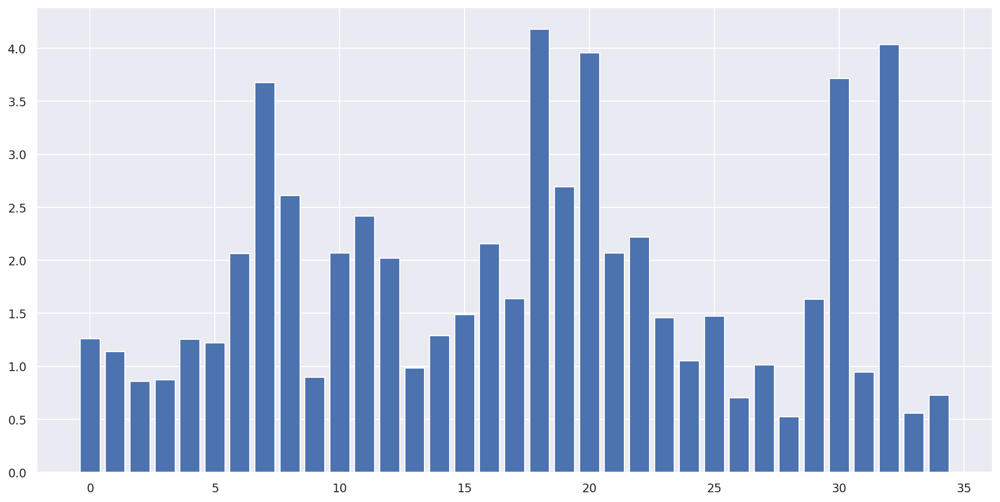

In [ ]:
# logistic regression for feature importance
import math
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from matplotlib import pyplot
# define dataset
X, y = df.iloc[:, : -1], df.iloc[:, -1]

# define the model
model = LogisticRegression()
# fit the model
model.fit(X, y)
# get importance
importance = model.coef_[0]
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], np.power(math.e, importance))
pyplot.show()

First, we created a basic logistic regression model using all the variables that we selected as potentially influential, as mentioned above. We used a decision tree to perform feature selection and determined the most important independent variables that affected the outcome of the dependent variable (which in thise case is the water right application outcome). To decide which variables were most important, we got the coefficients of each of the variables in the model, which we then plotted to visually represent each variables' importance. using this visualization, we can see that the 5 most important variables as determined by the decision tree were "PRIMARY_OWNER_ENTITY_TYPE_Federal Government, USE_CODE_Dust Control, USE_CODE_Fish and Wildlife Preservation and Enhancement, USE_CODE_Recreational, and USE_CODE_Stockwatering".

However, this model had a relatively lower accuracy and since we one-hot encoded the primary owner entity type and use code to deal with the face that they were categorical variables and not quantitative, we wanted to consider the set of primary owner columns at once when fed into the logistic regression model. Additionally, even though we were able to recognize that some features had a higher coeffiencient, there was no clear pattern and the difference seemed negligible. Thef, we iterated used our list of potentially relevant features to creat an encompassing list that contained all different combinations of each features.

Next, we iterated through all different combinations and selected the column for our X_train based on which combination of features produced the best f_1 score when fed through our model.


In [ ]:
#Use regex to find all the Primary columns after one hot econoding
import re

r = re.compile('PRIMARY')
vmatch = np.vectorize(lambda x:bool(r.match(x)))
A = df.columns
sel = vmatch(A)
sel

r = re.compile('USE_CODE')
vmatch = np.vectorize(lambda x:bool(r.match(x)))
A = df.columns
ye = vmatch(A)
ye 

#set prim_owner to list of all column names cotaining primary_owne
prim_owner = df.columns[sel]
type(prim_owner)
use_code = df.columns[ye]

In [ ]:
import itertools

stuff = ['USE_COUNT',  'NUMBER_OF_PROTESTS', 'QUANT_INCLUDED', 'USE_POP_INC', 'LATITUDE', 'NUM_OF_VIOLATIONS']
combos = []
for L in range(0, len(stuff)+1):
    for subset in itertools.combinations(stuff, L):
        combos.append(subset)
        
combos = combos[1: ]
combos

[('USE_COUNT',),
 ('NUMBER_OF_PROTESTS',),
 ('QUANT_INCLUDED',),
 ('USE_POP_INC',),
 ('LATITUDE',),
 ('NUM_OF_VIOLATIONS',),
 ('USE_COUNT', 'NUMBER_OF_PROTESTS'),
 ('USE_COUNT', 'QUANT_INCLUDED'),
 ('USE_COUNT', 'USE_POP_INC'),
 ('USE_COUNT', 'LATITUDE'),
 ('USE_COUNT', 'NUM_OF_VIOLATIONS'),
 ('NUMBER_OF_PROTESTS', 'QUANT_INCLUDED'),
 ('NUMBER_OF_PROTESTS', 'USE_POP_INC'),
 ('NUMBER_OF_PROTESTS', 'LATITUDE'),
 ('NUMBER_OF_PROTESTS', 'NUM_OF_VIOLATIONS'),
 ('QUANT_INCLUDED', 'USE_POP_INC'),
 ('QUANT_INCLUDED', 'LATITUDE'),
 ('QUANT_INCLUDED', 'NUM_OF_VIOLATIONS'),
 ('USE_POP_INC', 'LATITUDE'),
 ('USE_POP_INC', 'NUM_OF_VIOLATIONS'),
 ('LATITUDE', 'NUM_OF_VIOLATIONS'),
 ('USE_COUNT', 'NUMBER_OF_PROTESTS', 'QUANT_INCLUDED'),
 ('USE_COUNT', 'NUMBER_OF_PROTESTS', 'USE_POP_INC'),
 ('USE_COUNT', 'NUMBER_OF_PROTESTS', 'LATITUDE'),
 ('USE_COUNT', 'NUMBER_OF_PROTESTS', 'NUM_OF_VIOLATIONS'),
 ('USE_COUNT', 'QUANT_INCLUDED', 'USE_POP_INC'),
 ('USE_COUNT', 'QUANT_INCLUDED', 'LATITUDE'),
 ('USE_COUNT

In [ ]:
final_1 = [prim_owner]
for a in combos:
    b = list(a)
    c = np.concatenate((b, prim_owner))
    final_1.append(c)

final_2 = [use_code]
for a in final_1:
    b = list(a)
    c = np.concatenate((b, use_code))
    final_2.append(c)

In [ ]:
df["A/NP"] = df["A/NP"].astype(int)
val["A/NP"] = val["A/NP"].astype(int)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
models = []
highest_so_far = 0
best_feats = []
eval_nums = []
the_tp = 0
the_p = 0
the_fp = 0
the_fn = 0 
the_tn = 0 
predictions = None

for features in final_2: 
    X = df.loc[:, features]
    
    y = df.iloc[:, -1]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42)
    
    
    
    model = LogisticRegression()
    model.fit(X_train, y_train)
        
    y_test = y_test.to_numpy()
    
    predicts = model.predict(X_test)
    tp = np.sum((predicts == 1) & (y_test == 1))
    tn = np.sum((predicts == 0) & (y_test == 0))

    fp = np.sum((predicts == 1) & (y_test == 0))
    fn = np.sum((predicts == 0) & (y_test == 1))
    Precision = tp / (tp + fp)
    Recall = tp/ (tp + fn)
    f_1_score = 2 * (Precision * Recall) / (Precision + Recall)

    
    eval_nums.append(f_1_score)
        



    if f_1_score > highest_so_far: 
        the_tp = tp
        the_fp = fp
        the_tn = tn
        the_fn = fn
        highest_so_far = f_1_score      
        models.append(model)
        best_feats.append(features)
        predictions = model.predict(X_test)
        

           
best = best_feats[-1]
highest_so_far, best, 

(0.8784464381925086,
 array(['USE_COUNT', 'QUANT_INCLUDED', 'LATITUDE',
        'PRIMARY_OWNER_ENTITY_TYPE_Estate',
        'PRIMARY_OWNER_ENTITY_TYPE_Federal Government',
        'PRIMARY_OWNER_ENTITY_TYPE_Government (State/Municipal)',
        'PRIMARY_OWNER_ENTITY_TYPE_Individual',
        'PRIMARY_OWNER_ENTITY_TYPE_Limited Liability Company',
        'PRIMARY_OWNER_ENTITY_TYPE_Limited Partner',
        'PRIMARY_OWNER_ENTITY_TYPE_Organization/Association',
        'PRIMARY_OWNER_ENTITY_TYPE_Partnership or Co-owners',
        'PRIMARY_OWNER_ENTITY_TYPE_Receivership/Fiduciary',
        'PRIMARY_OWNER_ENTITY_TYPE_Trust', 'USE_CODE_Aquaculture',
        'USE_CODE_Domestic', 'USE_CODE_Dust Control',
        'USE_CODE_Fire Protection',
        'USE_CODE_Fish and Wildlife Preservation and Enhancement',
        'USE_CODE_Frost Protection', 'USE_CODE_Heat Control',
        'USE_CODE_Incidental Power', 'USE_CODE_Industrial',
        'USE_CODE_Irrigation', 'USE_CODE_Mining', 'USE_CODE_Municipa

In [ ]:
models[-1].coef_

array([[-0.12679721, -0.49686966,  0.20559229,  0.90065803,  1.20515165,
         0.99075999, -0.0459332 ,  0.81807565,  1.01323146,  0.78377412,
         0.20753732,  0.18993091,  0.473109  ,  1.09640021,  0.80970263,
         1.57133303,  1.30924651,  1.57535537,  0.98984211,  0.76541329,
         0.54546276,  0.47185806,  0.68877228, -0.17845401,  0.19787049,
        -0.53284911,  0.94960489,  1.645136  , -0.03709372,  1.66666025]])

We can see above that the logistic regression model identified the most influential variables as use count, quantity of water diverted, latitude, primary owner entity type, and use code. These were the features that when combined, produced the best f1 score. The model's beta coefficients for each chosen variable is also mentioned here. The beta coefficients show how important a variable was in determining the final prediction of the model. The variables with a higher beta coefficient mean that there is a higher effect on the outcome of the prediction. Thus, we can see that overall, the use codes and primary owner entity types have a higher effect on application results. Specifically, the top factors that affect the outcome are USE_CODE_Domestic (1.57), USE_CODE_Dust Control(1.31),USE_CODE_Fire Protection (1.58), USE_CODE_Recreational (1.65), and PRIMARY_OWNER_ENTITY_TYPE_Federal Government (1.21). The negative coefficients of variables mean that an increase in those variables are less likely to get an application approved. 

### Deliverable #4: Does the number of protests influence likelihood of approval?


As we can see from the model created above, the number of protests as a feature is not a part of the best features list and was also previously not identified as one of the features with the top 5 coefficients. This is not to say that it had no affect on a water right approval. Rather, it simply means that other features were a bigger influence. Specifially, the beta coefficient of -0.13387 as found in the decision tree shows that the more protests there are, the less likely an application is to being approved, but only to a small extent. 

Therefore, we can conclude that the protests do influence the likelihood of approval, as there is a small correlation between more protests and less likelihood of approval. Additionally, it is worth mentioning that the majority of the rows in the number of protests column were 0, meaning that there either werent't any protests, or the number of protests did not get recorded. This could explain the small correlation between the two, as the majority of the data was filled with 0's. Therefore, our findings show that the number of protests may have a higher likelihood of an application being rejected, as there historically hasn't been that many protests occurring or logged, but there is a correlation between protests and application rejections.

### Deliverable #5: Can we predict is a pending application will be approved? 

To predict the likelihood of an application being approved, we created a logistic regression model as described above. Our model used feature selection to determine the most influential variables in approving applications. We trained the model on 67% of the data, and tested it on 33%. The best f1-score we got from our selected model was 0.88. F1 score combines the two metrics of precision and recall and is the average of the two. Our high F1 score means that the model has both a high precision and recall score. 

Precision is a measure of the percentage that is correct out of everything that has been predicted as approved. So, a high precision means that out of all the positives that the model predicts, most of them are very likely to be correctly classified as positive. Recall measures how many positives the model managed to find out of everything that is actually positive. A high recall means that the model can find all the positive cases in the data, even if it incorrectly identifies some negative cases as positives.

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.77      0.03      0.05      5294
           1       0.78      1.00      0.88     18795

    accuracy                           0.78     24089
   macro avg       0.78      0.51      0.47     24089
weighted avg       0.78      0.78      0.70     24089



<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=37b907c3-2635-4133-aca7-5282be3440ea' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>